In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing
plt.style.use('ggplot')

train = pd.read_csv('../data/train.csv', index_col=0)
train.columns
train.shape

MSZoningMask = (train.MSZoning=='A') | (train.MSZoning=='C') | (train.MSZoning=='I') | (train.MSZoning=='C (all)')
train = train[~MSZoningMask]


In [2]:
train = train.fillna(value=0)

In [3]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 1500)
train.sample(10)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1034,20,RL,0.0,8125,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,Stone,295.0,Gd,TA,PConc,Gd,TA,No,GLQ,986,Unf,0,668,1654,GasA,Ex,Y,SBrkr,1654,0,0,1654,1,0,2,0,3,1,Gd,6,Typ,0,0,Attchd,2002.0,Unf,3,900,TA,TA,Y,0,136,0,0,0,0,0,0,0,0,2,2006,WD,Normal,230000
45,20,RL,70.0,7945,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1959,1959,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,179,BLQ,506,465,1150,GasA,Ex,Y,FuseA,1150,0,0,1150,1,0,1,0,3,1,TA,6,Typ,0,0,Attchd,1959.0,RFn,1,300,TA,TA,Y,0,0,0,0,0,0,0,0,0,0,5,2006,WD,Normal,141000
567,60,RL,77.0,11198,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2007,Hip,CompShg,VinylSd,VinylSd,BrkFace,245.0,Gd,TA,PConc,Gd,Gd,No,Unf,0,Unf,0,1122,1122,GasA,Ex,Y,SBrkr,1134,1370,0,2504,0,0,2,1,4,1,Ex,11,Typ,1,Gd,BuiltIn,2005.0,Fin,3,656,TA,TA,Y,144,39,0,0,0,0,0,0,0,0,6,2008,WD,Normal,325000
205,50,RM,50.0,3500,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1.5Fin,5,7,1947,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,TA,CBlock,TA,TA,No,LwQ,312,Unf,0,408,720,GasA,TA,Y,SBrkr,720,564,0,1284,0,0,1,1,2,1,TA,5,Typ,0,0,Detchd,1948.0,Unf,1,240,TA,TA,Y,0,35,0,0,0,0,0,MnWw,0,0,4,2009,WD,Normal,110000
715,60,RL,0.0,13517,Pave,0,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533,Unf,0,192,725,GasA,Ex,Y,SBrkr,725,754,0,1479,0,0,2,1,3,1,Gd,6,Typ,0,0,Attchd,1976.0,RFn,2,475,TA,TA,Y,0,44,0,0,0,0,0,0,0,0,3,2010,WD,Normal,130500
1254,60,RL,0.0,17542,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Veenker,Norm,Norm,1Fam,2Story,7,7,1974,2003,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,Gd,LwQ,125,ALQ,1031,36,1192,GasA,TA,Y,SBrkr,1516,651,0,2167,1,0,2,1,3,1,Gd,9,Typ,2,Gd,Attchd,1974.0,RFn,2,518,TA,TA,Y,220,47,0,0,0,0,0,MnPrv,0,0,7,2007,WD,Normal,294000
608,20,RL,78.0,7800,Pave,0,Reg,Bnk,AllPub,Inside,Mod,Edwards,Norm,Norm,1Fam,2Story,5,8,1948,2002,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,CBlock,TA,Gd,No,GLQ,603,Unf,0,293,896,GasA,Ex,Y,SBrkr,1112,896,0,2008,1,0,3,0,3,1,Ex,8,Typ,0,0,Attchd,1948.0,Unf,1,230,TA,TA,Y,103,0,0,0,0,0,0,0,0,0,8,2006,WD,Normal,225000
395,50,RL,60.0,10134,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1.5Fin,5,6,1940,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,735,735,GasA,Gd,Y,FuseA,735,299,0,1034,0,0,1,0,2,1,TA,5,Typ,0,0,Detchd,1940.0,Unf,1,240,TA,TA,Y,0,39,0,0,0,0,0,0,0,0,7,2007,WD,Normal,109000
852,120,RL,0.0,3196,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,8,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,40.0,Gd,TA,PConc,Gd,TA,Gd,Unf,0,Unf,0,1273,1273,GasA,Ex,Y,SBrkr,1456,0,0,1456,0,0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2003.0,Fin,2,400,TA,TA,Y,143,20,0,0,0,0,0,0,0,0,5,2006,WD,Normal,215000


In [4]:
num_vals = [x for x in train.columns if train[x].dtype == 'int64' or train[x].dtype == 'float64'] 
num_df = train[num_vals]
num_df = num_df.iloc[:,1:]
#num_df.isnull().sum()



In [5]:
num_df.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1450.00000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,57.54000,10523.831724,6.114483,5.582069,1971.593103,1985.049655,103.828276,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1870.826207,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,181654.942069
std,34.71992,10012.185355,1.372860,1.107330,30.022696,20.552319,181.150114,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,449.875634,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,79176.485241
min,0.00000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,41.25000,7544.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1958.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,63.00000,9496.000000,6.000000,5.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1977.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163945.000000
75%,79.00000,11613.500000,7.000000,6.000000,2001.000000,2004.000000,166.000000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.00000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


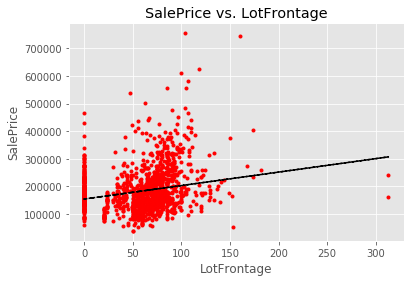

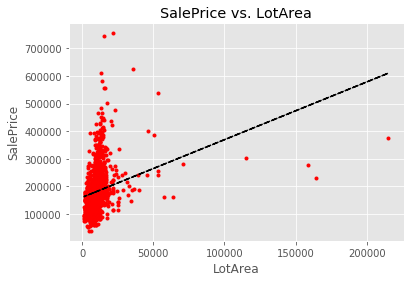

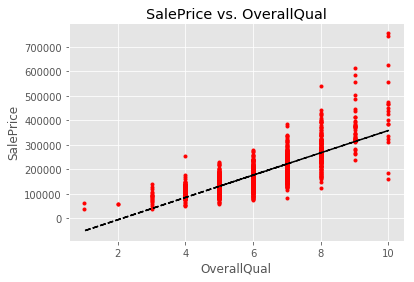

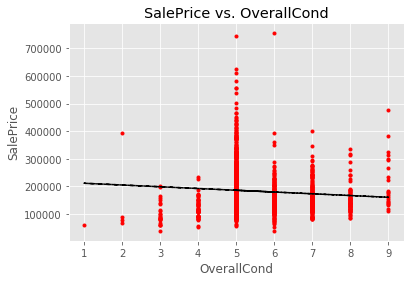

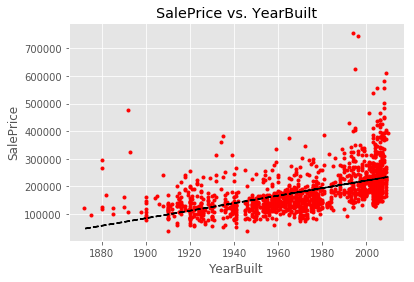

...

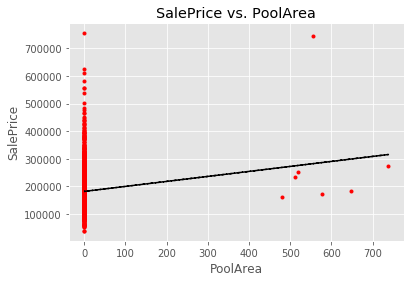

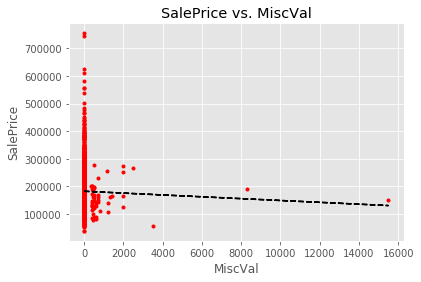

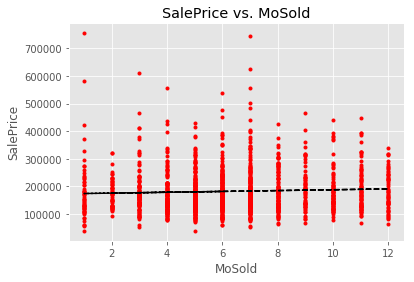

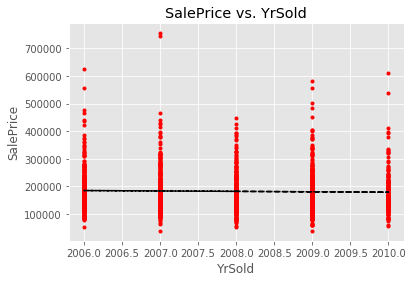

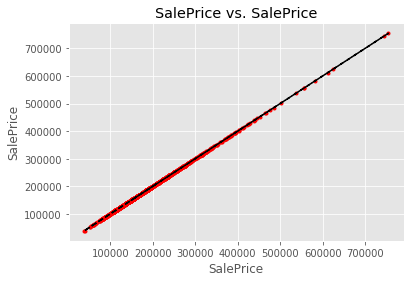

In [6]:
# Create Scatter Plots

for col in num_df.columns:
    
    x = num_df[col]
    y = num_df['SalePrice']
    
    # Plot
#     plt.scatter(x, y, marker=".", c = "blue")
    
    # Lables
    plt.title('SalePrice vs. ' + col)
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    
    # Fit Line
    m,b = np.polyfit(x, y, 1)
    
    # Plot
    plt.plot(x, y, 'r.', x, m*x+b, '--k') 
    
    plt.show()



In [7]:
vars(num_df)


{'_is_copy': None, '_data': BlockManager
 Items: Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
        'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
        'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
        'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
        'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
        'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
        'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
        'MoSold', 'YrSold', 'SalePrice'],
       dtype='object')
 Axis 1: Int64Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
             ...
             1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460],
            dtype='int64', name='Id', length=1450)
 FloatBlock: [0, 6, 23], 3 x 1450, dtype: float64
 IntBlock: [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 

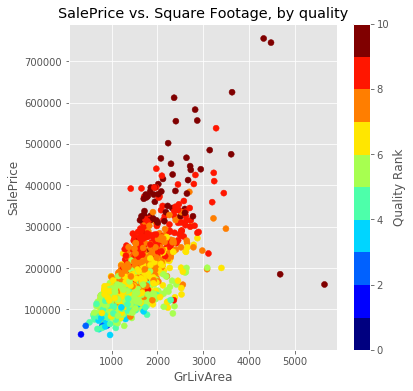

In [8]:
import matplotlib as mpl

x = num_df['GrLivArea']
y = num_df['SalePrice']
tag = num_df['OverallQual']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 10 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Quality Rank')
ax.set_title('SalePrice vs. Square Footage, by quality')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')


plt.show()

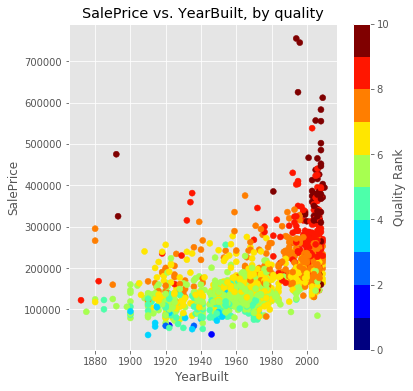

In [9]:
import matplotlib as mpl

x = num_df['YearBuilt']
y = num_df['SalePrice']
tag = num_df['OverallQual']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 10 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Quality Rank')
ax.set_title('SalePrice vs. YearBuilt, by quality')
plt.xlabel('YearBuilt')
plt.ylabel('SalePrice')


plt.show()

ValueError: c of shape (1450,) not acceptable as a color sequence for x with size 1450, y with size 1450

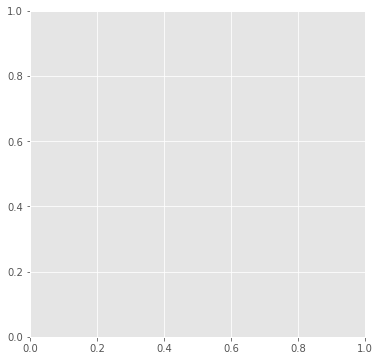

In [10]:
# Placeholder, for when Neighborhood is numbers

x = train['GrLivArea']
y = train['SalePrice']
tag = train['Neighborhood']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 25 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Neighborhood')
ax.set_title('SalePrice vs. Square Footage, by neighborhood')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')


plt.show()

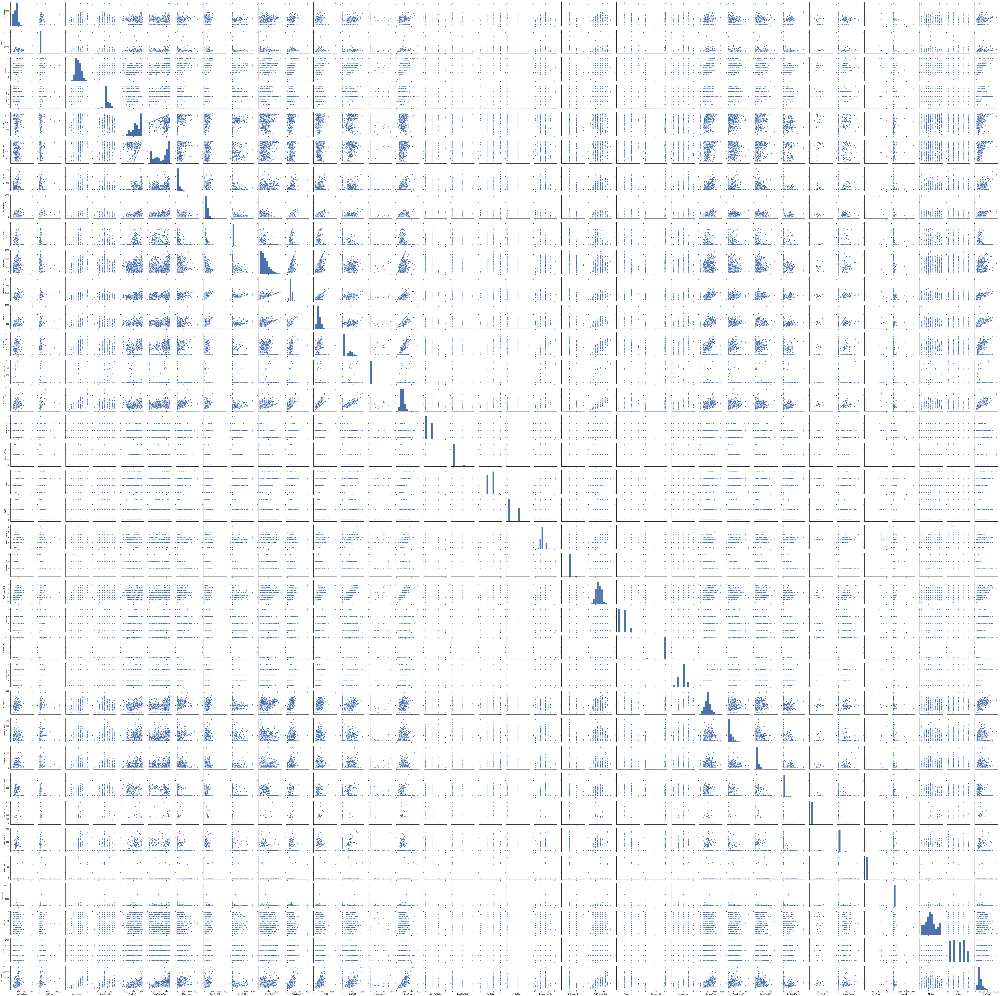

In [11]:
import seaborn as sns
sns.set(style="ticks")


sns.pairplot(num_df)

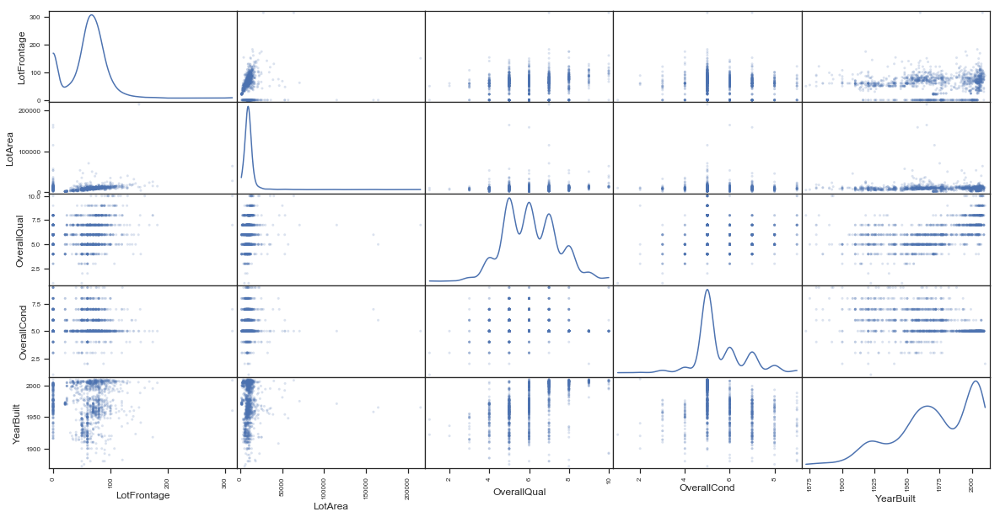

In [12]:
split_size = 5
pd.plotting.scatter_matrix(num_df.iloc[:, 0:split_size], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

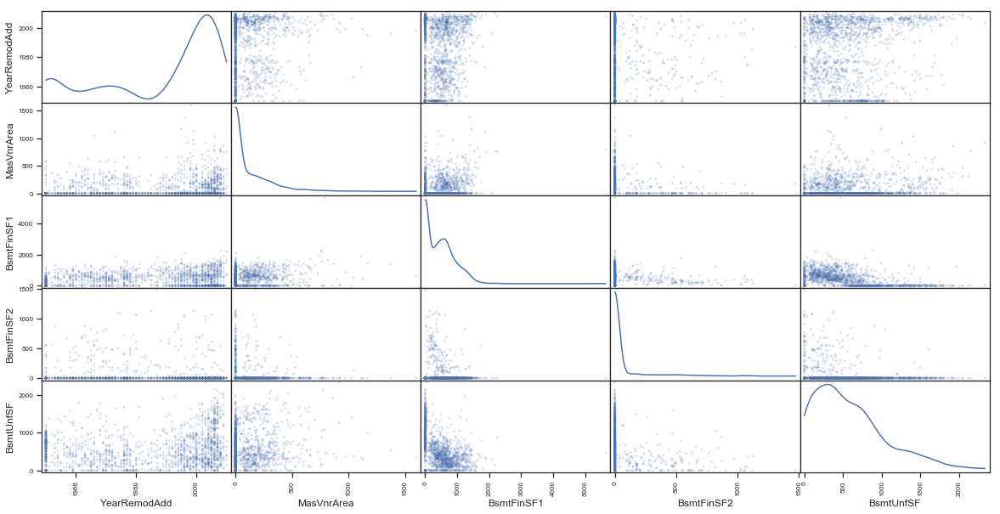

In [13]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size:split_size*2], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

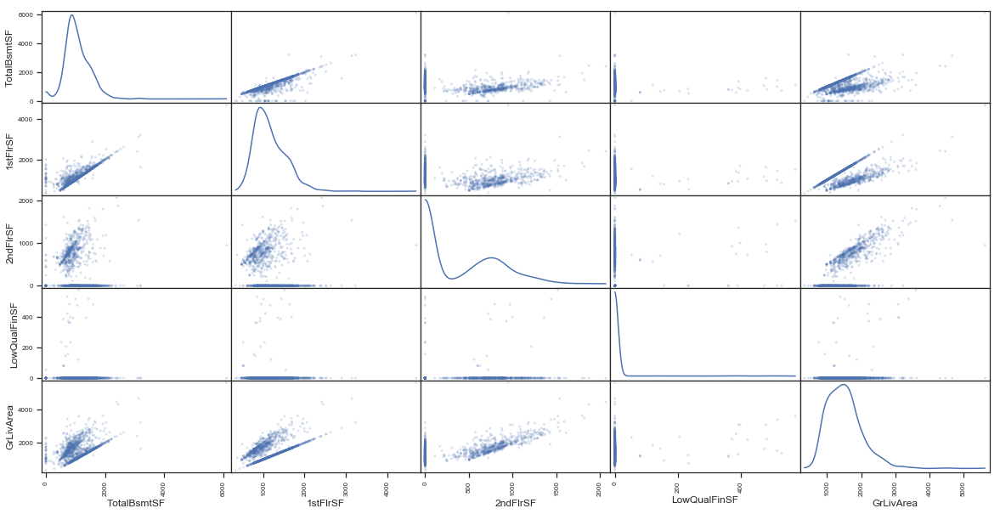

In [14]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*2:split_size*3], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

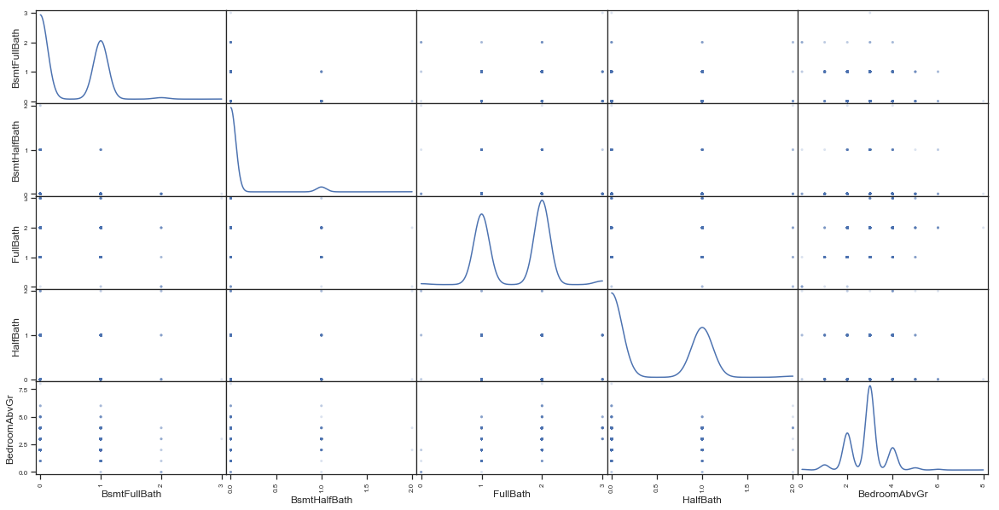

In [15]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*3:split_size*4], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

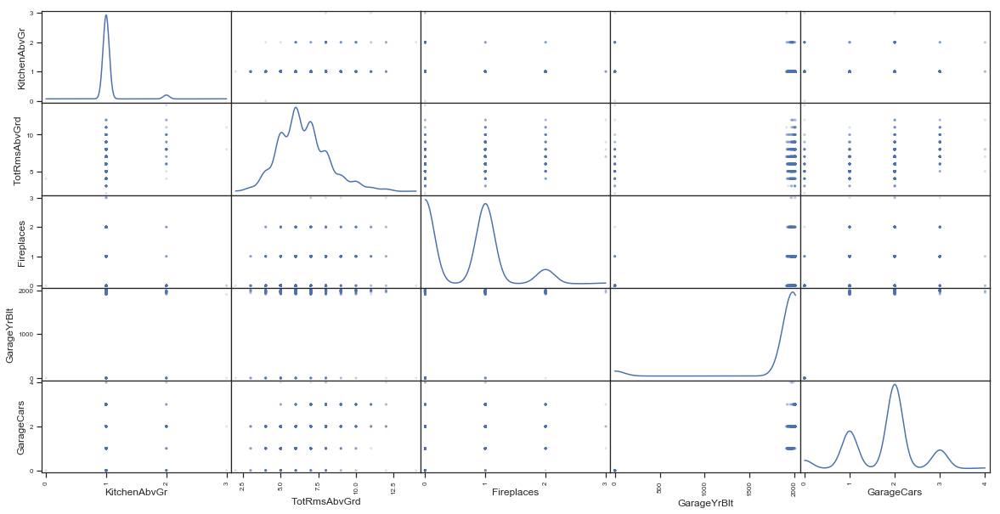

In [16]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*4:split_size*5], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

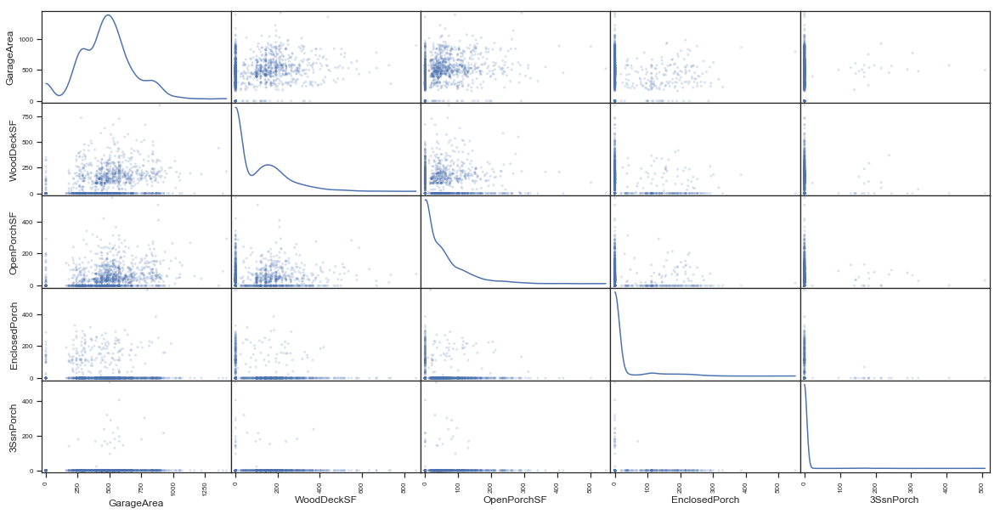

In [17]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*5:split_size*6], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

In [18]:
cat_values = [x for x in train.columns if x not in num_df.columns]
cat_df = train[cat_values]
#cat_df.isnull().sum()

In [19]:
cat_df.iloc[:,0:(len(cat_values))]



,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,0,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal
2,20,RL,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal
3,60,RL,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal
4,70,RL,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,0,0,0,WD,Abnorml
5,60,RL,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal
6,50,RL,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,0,Attchd,Unf,TA,TA,Y,0,MnPrv,Shed,WD,Normal
7,20,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal
8,60,RL,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,Shed,WD,Normal
9,50,RM,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,0,0,0,WD,Abnorml


In [20]:
train.corr()['SalePrice']

MSSubClass      -0.087487
LotFrontage      0.214273
LotArea          0.264715
OverallQual      0.789031
OverallCond     -0.089084
YearBuilt        0.517602
YearRemodAdd     0.501186
MasVnrArea       0.471056
BsmtFinSF1       0.384475
BsmtFinSF2      -0.014145
BsmtUnfSF        0.216152
TotalBsmtSF      0.612088
1stFlrSF         0.603300
2ndFlrSF         0.319774
LowQualFinSF    -0.018755
GrLivArea        0.708658
BsmtFullBath     0.224054
BsmtHalfBath    -0.017561
FullBath         0.556674
HalfBath         0.280882
BedroomAbvGr     0.162008
KitchenAbvGr    -0.137825
TotRmsAbvGrd     0.533355
Fireplaces       0.463264
GarageYrBlt      0.258923
GarageCars       0.642135
GarageArea       0.629831
WoodDeckSF       0.320770
OpenPorchSF      0.329491
EnclosedPorch   -0.120765
3SsnPorch        0.043807
ScreenPorch      0.110540
PoolArea         0.092396
MiscVal         -0.021052
MoSold           0.051987
YrSold          -0.025391
SalePrice        1.000000
Name: SalePrice, dtype: float64

In [21]:
train.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.215415,-0.139725,0.028891,-0.063504,0.030056,0.035989,0.023617,-0.074762,-0.065991,-0.139862,-0.242933,-0.256336,0.304606,0.049734,0.069245,0.004554,-0.011513,0.127755,0.178640,-0.030009,0.274877,0.034751,-0.049409,-0.084350,-0.042209,-0.100045,-0.012677,-0.002789,-0.011016,-0.044032,-0.030057,0.008308,-0.007172,-0.015808,-0.019356,-0.087487
LotFrontage,-0.215415,1.000000,0.100273,0.183681,-0.049826,0.041029,0.081961,0.106697,0.079165,-0.008637,0.159562,0.239862,0.247524,0.044531,0.042045,0.223062,0.012828,-0.027684,0.123610,-0.011265,0.147850,0.035006,0.223205,0.046450,0.023311,0.166719,0.201015,-0.015127,0.072127,0.025923,0.023823,0.023599,0.114483,-0.060943,0.017440,-0.013954,0.214273
LotArea,-0.139725,0.100273,1.000000,0.106457,-0.006074,0.012958,0.013475,0.103071,0.214794,0.111037,-0.003035,0.261034,0.299984,0.051568,0.006429,0.264359,0.158232,0.049121,0.126324,0.013691,0.120122,-0.017014,0.190489,0.271941,0.072148,0.154124,0.179251,0.171632,0.087333,-0.016954,0.020349,0.043435,0.077652,0.037468,0.001500,-0.013579,0.264715
OverallQual,0.028891,0.183681,0.106457,1.000000,-0.107874,0.567392,0.544850,0.405799,0.235139,-0.062980,0.313101,0.536622,0.472004,0.295153,-0.016250,0.591722,0.107451,-0.043259,0.544777,0.270713,0.091649,-0.189207,0.426924,0.391760,0.286571,0.602533,0.570620,0.234394,0.320894,-0.104417,0.029411,0.062759,0.065112,-0.030910,0.078088,-0.024962,0.789031
OverallCond,-0.063504,-0.049826,-0.006074,-0.107874,1.000000,-0.390446,0.067475,-0.130376,-0.053095,0.038818,-0.135607,-0.177514,-0.152497,0.025345,0.050366,-0.086680,-0.057456,0.116901,-0.206639,-0.066594,0.004918,-0.090796,-0.064277,-0.030312,-0.016690,-0.194190,-0.158068,-0.008204,-0.034037,0.079229,0.025010,0.053216,-0.002421,0.069996,0.003308,0.046202,-0.089084
YearBuilt,0.030056,0.041029,0.012958,0.567392,-0.390446,1.000000,0.590105,0.308690,0.248222,-0.052726,0.150407,0.390050,0.277341,0.010472,-0.180007,0.196822,0.181910,-0.035431,0.465918,0.239575,-0.077527,-0.173492,0.095055,0.141373,0.269187,0.538183,0.484036,0.220369,0.197950,-0.380911,0.030387,-0.051326,0.004250,-0.034681,0.017254,-0.009111,0.517602
YearRemodAdd,0.035989,0.081961,0.013475,0.544850,0.067475,0.590105,1.000000,0.173008,0.123137,-0.070913,0.182766,0.285987,0.233655,0.138260,-0.065412,0.281259,0.115609,-0.016507,0.432980,0.180705,-0.050315,-0.155683,0.187457,0.104571,0.145717,0.421333,0.377573,0.201867,0.237689,-0.187094,0.044605,-0.042288,0.005259,-0.009716,0.023540,0.040420,0.501186
MasVnrArea,0.023617,0.106697,0.103071,0.405799,-0.130376,0.308690,0.173008,1.000000,0.260390,-0.072568,0.114022,0.358716,0.338169,0.173841,-0.067594,0.387628,0.080834,0.028291,0.270862,0.197571,0.100638,-0.037786,0.279355,0.244874,0.131776,0.362184,0.373735,0.157778,0.126115,-0.106982,0.018708,0.062015,0.011671,-0.029415,-0.004747,-0.006922,0.471056
BsmtFinSF1,-0.074762,0.079165,0.214794,0.235139,-0.053095,0.248222,0.123137,0.260390,1.000000,-0.051244,-0.494616,0.521739,0.444455,-0.140691,-0.060309,0.204742,0.651115,0.063363,0.052862,0.001151,-0.114256,-0.086628,0.040615,0.256922,0.115756,0.224263,0.300094,0.203239,0.111795,-0.098826,0.026138,0.059746,0.140668,0.004120,-0.017519,0.018654,0.384475
BsmtFinSF2,-0.065991,-0.008637,0.111037,-0.062980,0.038818,-0.052726,-0.070913,-0.072568,-0.051244,1.000000,-0.209824,0.103774,0.095856,-0.099768,0.017333,-0.010915,0.157870,0.071720,-0.078975,-0.033355,-0.017199,-0.040547,-0.036119,0.045482,0.034156,-0.039772,-0.018797,0.066687,0.003697,0.038838,-0.030235,0.088801,0.041585,0.005015,-0.014277,0.032596,-0.014145


In [22]:
# correlations=train.corr()

# attrs = correlations.iloc[:-1,:-1] 


# threshold = .4
# rel_corrs = (attrs[abs(attrs) > threshold][attrs != 1]).unstack().to_dict()

# unique_corrs = pd.DataFrame(
#     list(set([(tuple(sorted(key)), rel_corrs[key]) 
    
#     for key in rel_corrs])), 
#         columns=['Attribute Pair', 'Correlation'])


# # absolute value and sort
# unique_corrs = unique_corrs.iloc[abs(unique_corrs['Correlation']).argsort()]

# unique_corrs


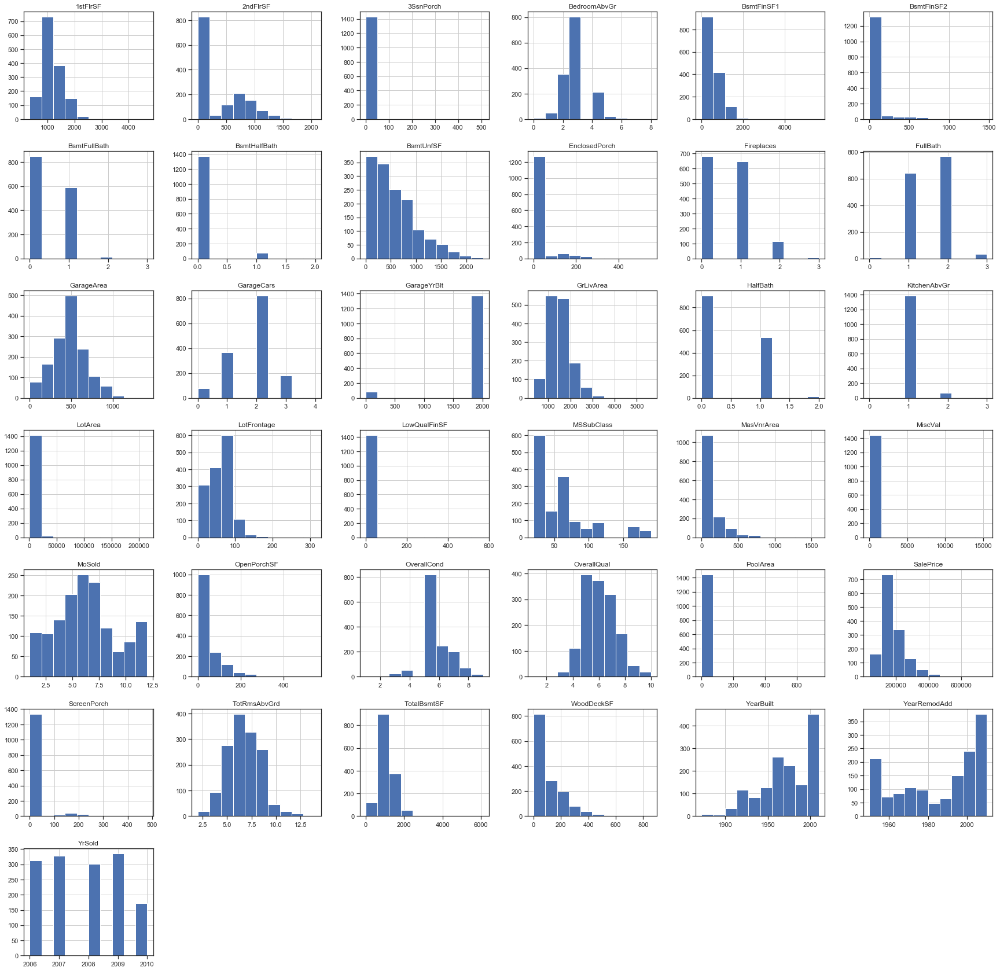

In [23]:
train.hist(figsize=(30,30))

plt.show()

In [24]:
unf_count = train[train['BsmtUnfSF']>0]
len(unf_count)



1333

In [25]:
def make_num(val):
    new_list = []
    if val == 'Ex':
        num = 5
    elif val == 'Gd':
        num = 4
    elif val == 'TA':
        num = 3
    elif val == 'Fa':
        num = 2
    elif val == 'Po':
        num = 1
    else:
        num = 0
    return int(num)

new_dict = {'Kitchen':0, 'Fireplace': 0, 'GarageQ': 0, 'GarageC':0, 'ExterQ': 0, 'ExterC':0, 'BsmtQ':0, 
            'BsmtC':0, 'HeatingQ': 0, "PoolQ": 0}

name_list = list(new_dict.keys())

orig_list = ["KitchenQual", 'FireplaceQu', 'GarageQual', 'GarageCond', 
 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
'PoolQC']

i=0
for thing in orig_list:  
    new_list = list(map(make_num,train[thing]))
    new_dict[name_list[i]] = new_list
    
    i+=1
    
new_df = pd.DataFrame(new_dict)

new_df

,Kitchen,Fireplace,GarageQ,GarageC,ExterQ,ExterC,BsmtQ,BsmtC,HeatingQ,PoolQ
0,4,0,3,3,4,3,4,3,5,0
1,3,3,3,3,3,3,4,3,5,0
2,4,3,3,3,4,3,4,3,5,0
3,4,4,3,3,3,3,3,4,4,0
4,4,3,3,3,4,3,4,3,5,0
5,3,0,3,3,3,3,4,3,5,0
6,4,4,3,3,4,3,5,3,5,0
7,3,3,3,3,3,3,4,3,5,0
8,3,3,2,3,3,3,3,3,4,0
9,3,3,4,3,3,3,3,3,5,0


In [34]:
house = pd.concat([train, new_df], sort=True, axis=1)

In [27]:
for i in cat_df.columns:
    print(i)
    print (cat_df[i].value_counts())
    

MSSubClass
20     534
60     299
50     140
120     87
30      67
160     63
70      59
80      58
90      52
190     29
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
MSZoning
RL    1151
RM     218
FV      65
RH      16
Name: MSZoning, dtype: int64
Street
Pave    1446
Grvl       4
Name: Street, dtype: int64
Alley
0       1361
Grvl      50
Pave      39
Name: Alley, dtype: int64
LotShape
Reg    916
IR1    483
IR2     41
IR3     10
Name: LotShape, dtype: int64
LandContour
Lvl    1305
Bnk      62
HLS      49
Low      34
Name: LandContour, dtype: int64
Utilities
AllPub    1449
NoSeWa       1
Name: Utilities, dtype: int64
LotConfig
Inside     1044
Corner      261
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
LandSlope
Gtl    1375
Mod      62
Sev      13
Name: LandSlope, dtype: int64
Neighborhood
NAmes      225
CollgCr    150
OldTown    112
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes 

In [28]:
nosecond = train[train['2ndFlrSF']!=0]


In [29]:
nosecond.corr()['SalePrice']

MSSubClass      -0.254667
LotFrontage      0.247595
LotArea          0.284283
OverallQual      0.741685
OverallCond     -0.054456
YearBuilt        0.453938
YearRemodAdd     0.448566
MasVnrArea       0.461845
BsmtFinSF1       0.394168
BsmtFinSF2       0.007736
BsmtUnfSF        0.171141
TotalBsmtSF      0.597651
1stFlrSF         0.603710
2ndFlrSF         0.672916
LowQualFinSF     0.021357
GrLivArea        0.735356
BsmtFullBath     0.262475
BsmtHalfBath    -0.006476
FullBath         0.535389
HalfBath         0.348139
BedroomAbvGr     0.233475
KitchenAbvGr    -0.176085
TotRmsAbvGrd     0.533024
Fireplaces       0.455527
GarageYrBlt      0.234438
GarageCars       0.643792
GarageArea       0.638453
WoodDeckSF       0.333980
OpenPorchSF      0.283064
EnclosedPorch   -0.160424
3SsnPorch        0.014324
ScreenPorch      0.110882
PoolArea         0.149257
MiscVal         -0.023677
MoSold           0.026175
YrSold          -0.066299
SalePrice        1.000000
Name: SalePrice, dtype: float64

In [30]:
correlations=nosecond.corr()

attrs = correlations.iloc[:-1,:-1] 
attrs


threshold = -10
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation
313,"(GarageArea, GarageCars)",0.880463
383,"(1stFlrSF, GrLivArea)",0.878946
239,"(1stFlrSF, TotalBsmtSF)",0.811182
565,"(2ndFlrSF, GrLivArea)",0.801363
129,"(GrLivArea, TotRmsAbvGrd)",0.765653
13,"(GrLivArea, TotalBsmtSF)",0.741608
236,"(2ndFlrSF, TotRmsAbvGrd)",0.660959
584,"(BsmtFinSF1, TotalBsmtSF)",0.651468
75,"(BedroomAbvGr, TotRmsAbvGrd)",0.640658
131,"(BsmtFinSF1, BsmtFullBath)",0.628335


In [31]:
train['SecondFloor']  = [ 1 if x>0 else 0 for x in train['2ndFlrSF'] ]
'''Categorical substitutions yes/no:
Porch , Pool , Garage'''



'Categorical substitutions yes/no:\nPorch , Pool , Garage'

In [32]:
# RecSpace

'''
WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch
'''
# basement
''''''


''

In [33]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SecondFloor
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,0,0,0,2,2008,WD,Normal,208500,1
2,20,RL,80.0,9600,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,0,0,0,5,2007,WD,Normal,181500,0
3,60,RL,68.0,11250,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,0,0,0,9,2008,WD,Normal,223500,1
4,70,RL,60.0,9550,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,0,0,0,2,2006,WD,Abnorml,140000,1
5,60,RL,84.0,14260,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,0,0,0,12,2008,WD,Normal,250000,1
6,50,RL,85.0,14115,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,0,MnPrv,Shed,700,10,2009,WD,Normal,143000,1
7,20,RL,75.0,10084,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,0,0,0,8,2007,WD,Normal,307000,0
8,60,RL,0.0,10382,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,0,0,Shed,350,11,2009,WD,Normal,200000,1
9,50,RM,51.0,6120,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,0,0,0,4,2008,WD,Abnorml,129900,1


In [36]:
clean = pd.read_csv('../data/clean.csv', index_col=0)

In [41]:
clean.shape

(1450, 53)

In [ ]:
pd.read_csv('../data/clean.csv', index_col=0)